In [1]:
from hidrocomp.series import Flow
import pandas as pd
import plotly as py
import plotly.graph_objects as go

In [2]:
flow_ana = Flow(data=pd.read_csv("ana.csv", index_col=0, parse_dates=True)["66231000"].to_frame())

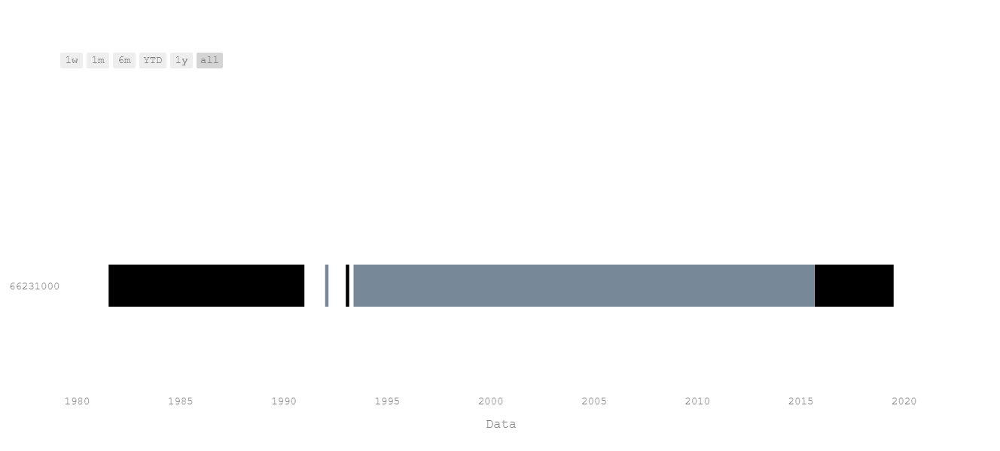

In [3]:
fig_gantt, data_gantt = flow_ana.gantt("")
py.offline.iplot(fig_gantt)

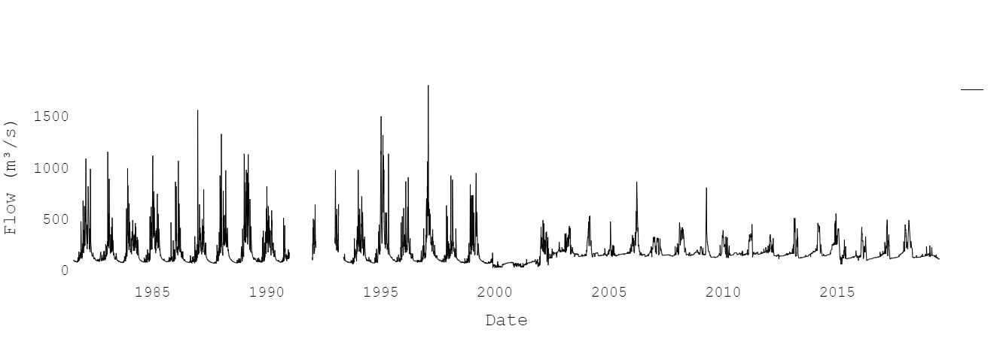

In [47]:
fig_hydro, data_hydro = flow_ana.hydrogram("", size_text=20)
py.offline.iplot(fig_hydro)

In [5]:
flow_pre = Flow(data=flow_ana.data).date(date_end="30/11/1999")
flow_pre.month_abr_flood

'AS-AUG'

In [6]:
threshold_high = flow_pre.quantile(0.75)[0]
threshold_low = flow_pre.quantile(0.50)[0]

In [7]:
flow_pre1 = Flow(data=flow_pre.data).date(date_start="01/08/1981", date_end="31/7/1990")

In [8]:
flow_pre2 = Flow(data=flow_pre.data).date(date_start="01/08/1993", date_end="31/07/1999")
date_range = pd.date_range(start=pd.to_datetime("01/08/1990", dayfirst=True), end=pd.to_datetime("30/07/1996", dayfirst=True))
flow_pre2.data.index = date_range

In [9]:
flow_pre_join = Flow(data=flow_pre1.data.combine_first(flow_pre2.data))

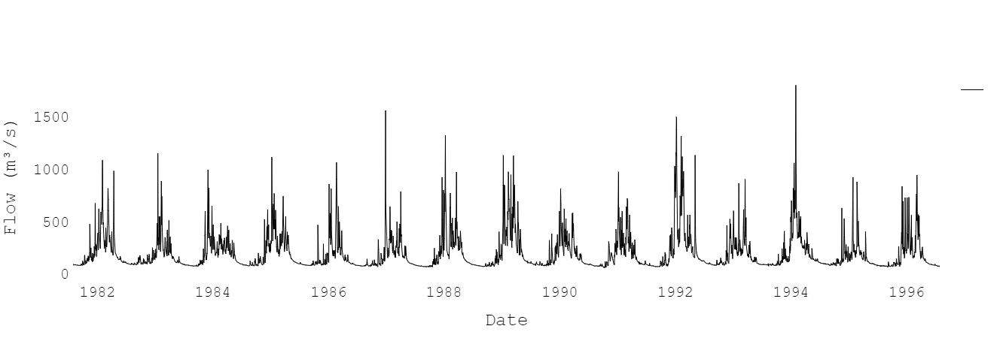

In [48]:
fig_hydro_join, data_hydro_join = flow_pre_join.hydrogram("", size_text=20)
py.offline.iplot(fig_hydro_join)

In [11]:
iha_pre = flow_pre_join.iha(status='pre', statistic="no-parametric", central_metric="mean", month_water = 9, variation_metric="std", type_threshold="stationary", 
                   threshold_high=threshold_high, threshold_low=threshold_low, type_criterion="autocorrelation", duration=1, 
                   aspects=["Magnitude and Duration", "Frequency and Duration", "Timing Extreme"], magnitude_and_duration=["1-day maximum", "1-day minimum"], 
                   timing=["Date of maximum", "Date of minimum"])

In [12]:
iha_pre.summary()

,Coeff. of Var.,Means
1-day maximum,65.803658,477.665913
1-day minimum,9.210436,90.366426
High events count,2.484236,11.200000
Low events count,2.531704,7.533333
High events duration,3.196421,8.690967
Low events duration,18.607038,27.163884
Date of maximum,41.115448,174.543396
Date of minimum,25.602632,284.774671


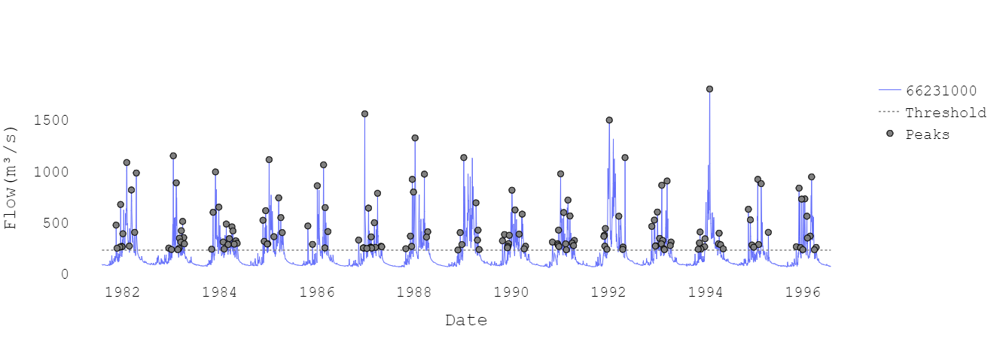

In [49]:
fig_events_high, data_events_high = iha_pre.events_high.plot_hydrogram(title="", point_start_end=False, size_text=20)
py.offline.iplot(fig_events_high)

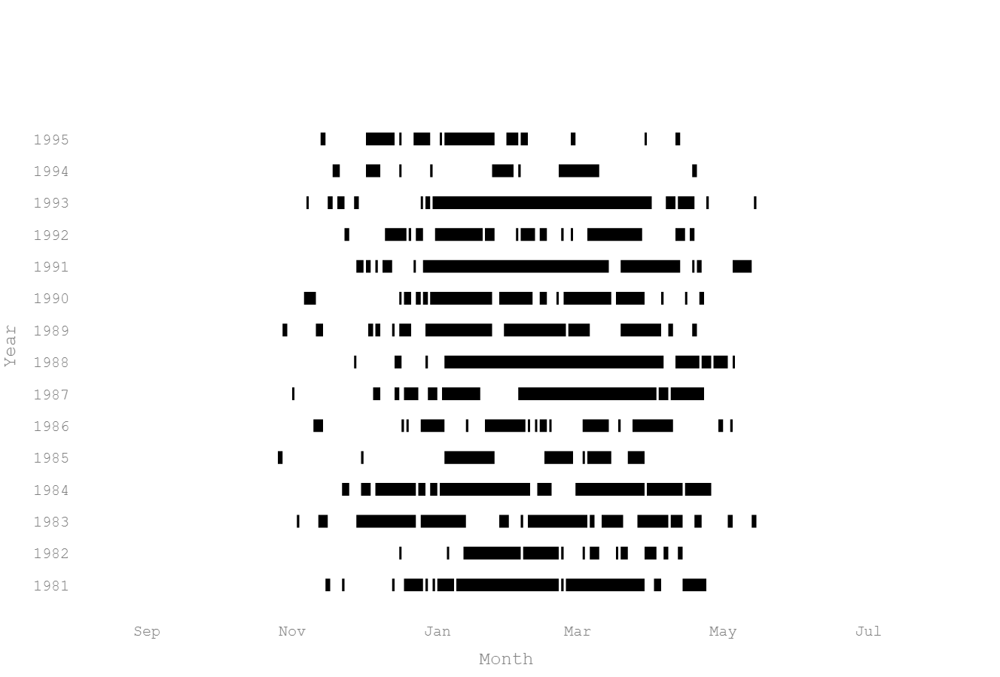

In [50]:
fig_events_high_spells, data_events_high_spells = iha_pre.events_high.plot_spells("", size_text=20)
py.offline.iplot(fig_events_high_spells)

In [51]:
# fig_spells_before_high = go.Figure(fig_events_high_spells)
# fig_spells_before_high.write_image("fig_spells_before_high.png", width=1400, height=1000)

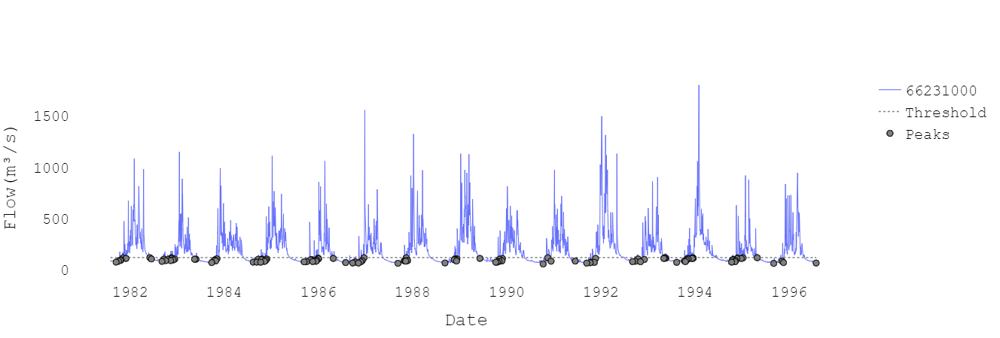

In [52]:
fig_events_low, data_events_low = iha_pre.events_low.plot_hydrogram(title="", point_start_end=False, size_text=20)
py.offline.iplot(fig_events_low)

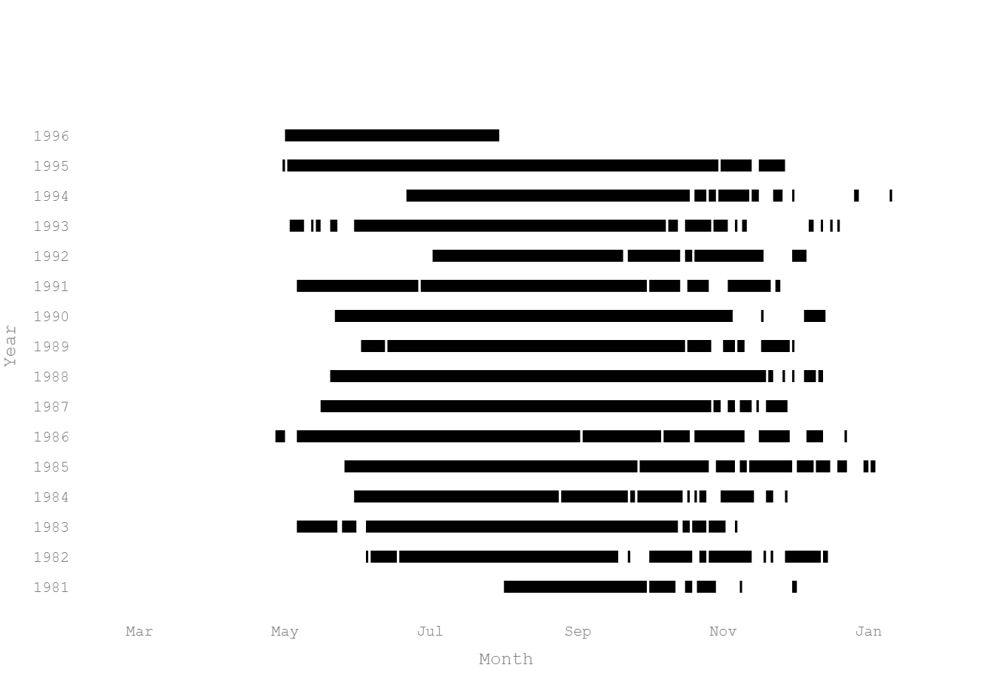

In [53]:
fig_events_low_spells, data_events_low_spells = iha_pre.events_low.plot_spells("", size_text=20)
py.offline.iplot(fig_events_low_spells)

In [54]:
# fig_spells_before_low = go.Figure(fig_events_low_spells)
# fig_spells_before_low.write_image("fig_spells_before_low.png", width=1400, height=1000)

## Pós

In [19]:
flow_pos = Flow(data=flow_ana.data).date(date_start="01/08/2003", date_end="31/7/2015")

In [20]:
iha_pos = flow_pos.iha(status='pos', statistic="no-parametric", central_metric="mean", month_water = 9, variation_metric="std", type_threshold="stationary", 
                   threshold_high=threshold_high, threshold_low=threshold_low, type_criterion="autocorrelation", duration=1, 
                   aspects=["Magnitude and Duration", "Frequency and Duration", "Timing Extreme"], magnitude_and_duration=["1-day maximum", "1-day minimum"], 
                   timing=["Date of maximum", "Date of minimum"])

In [21]:
iha_pos.summary()

,Coeff. of Var.,Means
1-day maximum,90.469093,366.652994
1-day minimum,9.181074,110.964277
High events count,1.783765,3.500000
Low events count,2.870962,1.333333
High events duration,21.437552,25.904762
Low events duration,8.915168,8.206667
Date of maximum,51.383922,102.806548
Date of minimum,64.478586,143.240000


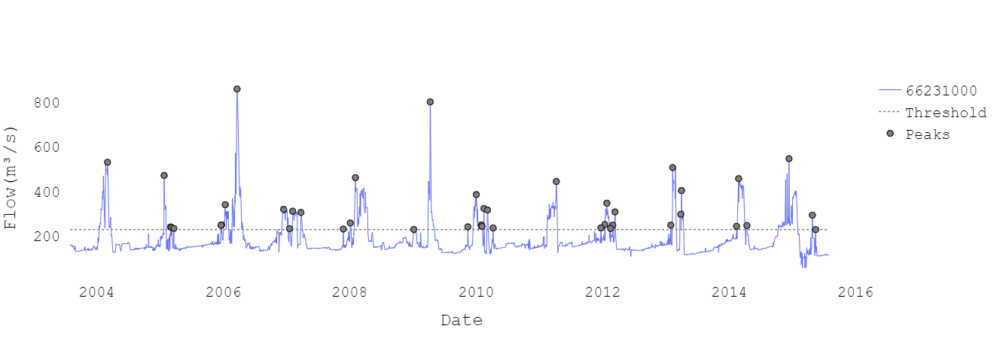

In [55]:
fig_events_high_pos, data_events_high_pos = iha_pos.events_high.plot_hydrogram(title="", point_start_end=False, size_text=20)
py.offline.iplot(fig_events_high_pos)

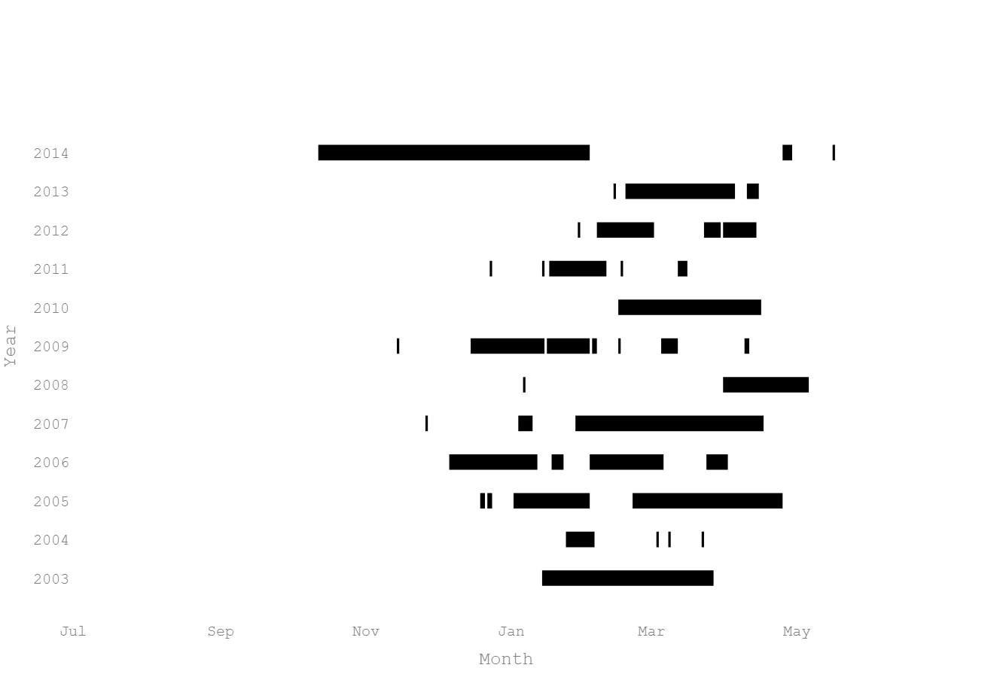

In [56]:
fig_events_high_spells_pos, data_events_high_spells_pos = iha_pos.events_high.plot_spells("", size_text=20)
py.offline.iplot(fig_events_high_spells_pos)

In [57]:
# fig_spells_after_high = go.Figure(fig_events_high_spells_pos)
# fig_spells_after_high.write_image("fig_spells_after_high.png", width=1400, height=1000)

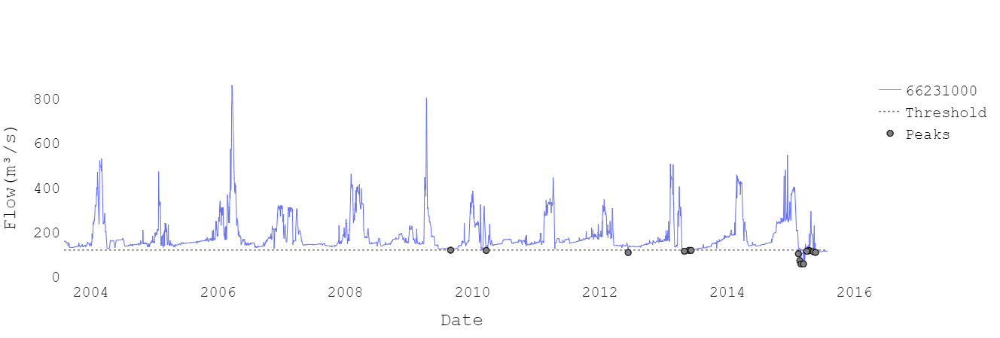

In [58]:
fig_events_low_pos, data_events_low_pos = iha_pos.events_low.plot_hydrogram(title="", point_start_end=False, size_text=20)
py.offline.iplot(fig_events_low_pos)

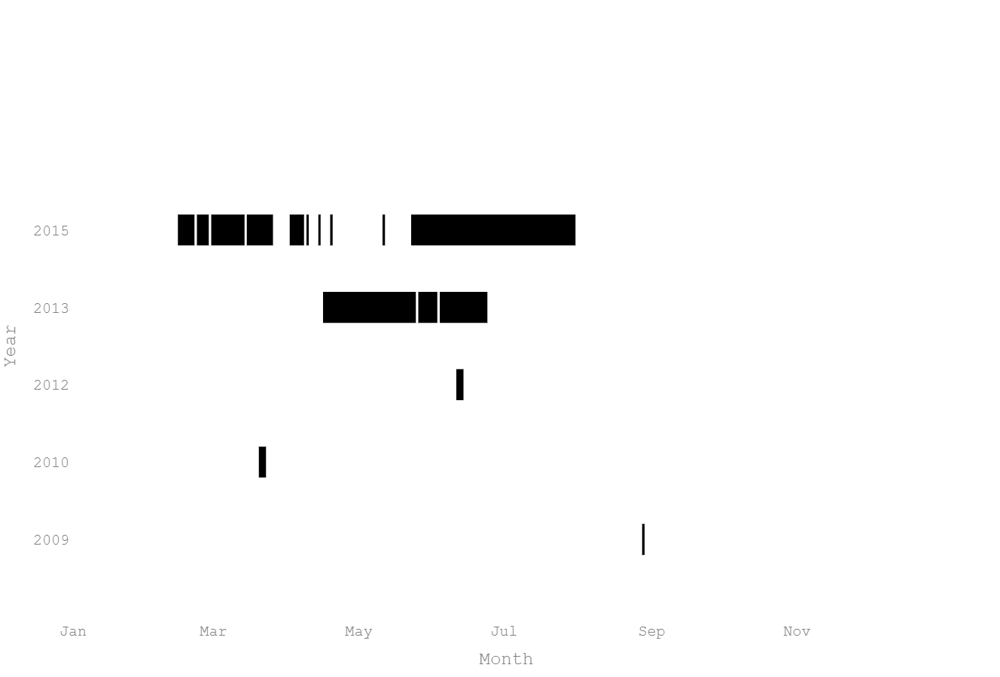

In [59]:
fig_events_low_spells_pos, data_events_low_spells_pos = iha_pos.events_low.plot_spells("", size_text=20)
py.offline.iplot(fig_events_low_spells_pos)

In [60]:
# fig_spells_after_low = go.Figure(fig_events_low_spells_pos)
# fig_spells_after_low.write_image("fig_spells_after_low.png", width=1400, height=1000)

In [61]:
fig_polar_pre_high, data_polar_pre_high = iha_pre.events_high.plot_polar(title="Events High", color="#00008B")
fig_polar_pos_high, data_polar_pos_high = iha_pos.events_high.plot_polar(title="Events High", color="#00008B")

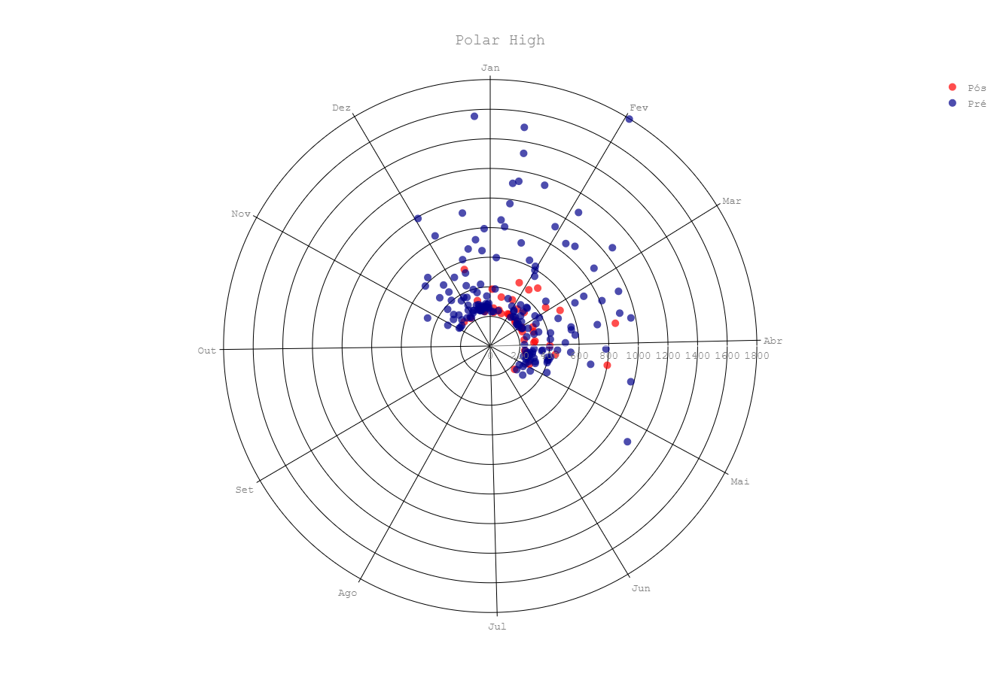

In [62]:
layout=fig_polar_pos_high['layout']

layout['title']['text'] = "Polar High"
data_polar_pos_high[0]['marker']['color'] = "red"
data_polar_pos_high[0]['name'] = "Pós"
data_polar_pre_high[0]['name'] = "Pré"
data_polar_pos_high = dict(data=data_polar_pos_high+[data_polar_pre_high[0]], layout=layout)

py.offline.iplot(data_polar_pos_high)

In [42]:
# fig_polar_before_after_high = go.Figure(data_polar_pos_high)
# fig_polar_before_after_high.write_image("fig_polar_before_after_high.png", width=1400, height=1000)

In [63]:
names = {"1-day maximum": "1-day", "Date of maximum": "Date", "High events count": "Count", "High events duration": "Duration", "1-day minimum": "1-day", "Date of minimum": "Date",
         "Low events count": "Count", "Low events duration": "Duration"}

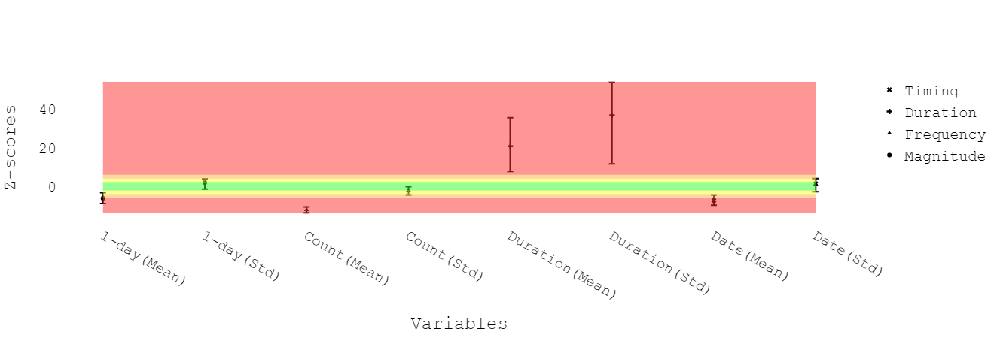

In [64]:
era = iha_pre.era(iha_obs=iha_pos, m=1000)
fig_high, data_high = era.plot(by_type_events="High", size_text=20, showlegend=True, names_variables=names)
py.offline.iplot(fig_high)

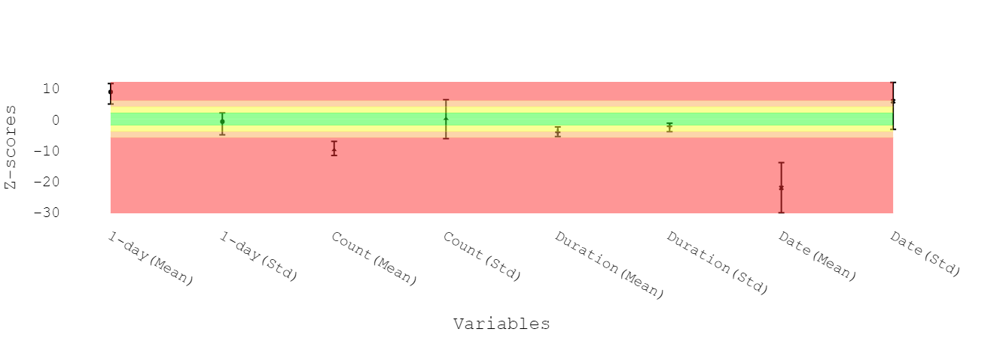

In [65]:
fig_low, data_low = era.plot(by_type_events="Low", showlegend=False, size_text=20, names_variables=names)
py.offline.iplot(fig_low)

In [66]:
# fig_low.write_image("zscore_low_before_after.png", width=1200, height=800)
# fig_high.write_image("zscore_high_before_after.png", width=1200, height=800)

In [35]:
era.values_mean()

1-day maximum           -6.266606
1-day minimum            8.798867
Date of maximum         -7.408135
Date of minimum        -22.305997
High events count      -12.312940
High events duration    20.746987
Low events count       -10.011229
Low events duration     -4.237549
Name: Pos - mean, dtype: float64

In [36]:
era.aspects["Magnitude and Duration"].values_mean

,Pre - 2_5,Pre - 97_5,Pos - 2_5,Pos - 97_5,Pre - mean,Pos - mean
1-day maximum,-1.825362,2.008671,-8.994649,-3.310629,0.0,-6.266606
1-day minimum,-1.975973,1.908173,4.890385,11.494284,0.0,8.798867


In [37]:
era.aspects["Magnitude and Duration"].values_std

,Pre - 2_5,Pre - 97_5,Pos - 2_5,Pos - 97_5,Pre - mean,Pos - mean
1-day maximum,-1.860148,1.844234,-1.443191,3.898683,0.0,1.899538
1-day minimum,-1.961686,1.855103,-5.132235,2.010258,0.0,-0.819863


In [38]:
era.aspects['Frequency and Duration'].values_mean

,Pre - 2_5,Pre - 97_5,Pos - 2_5,Pos - 97_5,Pre - mean,Pos - mean
High events count,-2.004011,1.950992,-13.788851,-10.715707,0.0,-12.312940
Low events count,-1.837508,2.049341,-11.797560,-7.208918,0.0,-10.011229
High events duration,-1.955701,2.100778,7.689826,35.593481,0.0,20.746987
Low events duration,-1.825786,2.146273,-5.634271,-2.530919,0.0,-4.237549


In [39]:
era.aspects['Frequency and Duration'].values_std

,Pre - 2_5,Pre - 97_5,Pos - 2_5,Pos - 97_5,Pre - mean,Pos - mean
High events count,-2.102858,1.810886,-4.473770,-0.194028,0.0,-2.201770
Low events count,-2.062375,1.923626,-6.351176,6.273835,0.0,0.109817
High events duration,-2.123661,1.831702,11.580262,53.914107,0.0,36.827880
Low events duration,-2.015084,1.814564,-4.065248,-1.325690,0.0,-2.339898


In [40]:
era.aspects['Timing Extreme'].values_mean

,Pre - 2_5,Pre - 97_5,Pos - 2_5,Pos - 97_5,Pre - mean,Pos - mean
Date of maximum,-1.928044,1.933878,-9.874715,-4.449923,0.0,-7.408135
Date of minimum,-2.103999,1.842333,-30.396835,-14.086263,0.0,-22.305997


In [41]:
era.aspects['Timing Extreme'].values_std

,Pre - 2_5,Pre - 97_5,Pos - 2_5,Pos - 97_5,Pre - mean,Pos - mean
Date of maximum,-1.927679,1.859927,-2.819290,3.996235,0.0,1.309886
Date of minimum,-1.734414,1.908057,-3.309387,11.909344,0.0,5.771884
